In [1]:
import pandas as pd
import numpy as np
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category = FutureWarning)
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category = FutureWarning)
import matplotlib.pyplot as plt
import seaborn as sb

import matplotlib.colors as colors
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA

In [3]:
df = pd.read_csv('Heart-Prediction-Dataset.csv', header = None)

df.columns = ['Age', 'Sex', 'Chest_Pain_Type', 'Resting_BPs', 'Cholestrol',
              'Fasting_Blood_Sugar', 'Resting_ECG', 'Max_Heart_Rate', 'Exercise_Induced_Angina', 
              'ST_depression_induced', 'Peak_ST', 'No_Of_Major_Vessels', 'Thal', 'Target_Disease']
#check the dataset having missing values or not
print(df.isnull().sum())
#add missing values in dataset
df['Target_Disease'] = df.Target_Disease.map({0: 0, 1: 1, 2: 1, 3: 1, 4: 1})
df['Sex'] = df.Sex.map({0: 'female', 1: 'male'})
df['Thal'] = df.Thal.fillna(df.Thal.mean())
df['No_Of_Major_Vessels'] = df.No_Of_Major_Vessels.fillna(df.No_Of_Major_Vessels.mean())
df

Age                        0
Sex                        0
Chest_Pain_Type            0
Resting_BPs                0
Cholestrol                 0
Fasting_Blood_Sugar        0
Resting_ECG                0
Max_Heart_Rate             0
Exercise_Induced_Angina    0
ST_depression_induced      0
Peak_ST                    0
No_Of_Major_Vessels        4
Thal                       2
Target_Disease             0
dtype: int64


,Age,Sex,Chest_Pain_Type,Resting_BPs,Cholestrol,Fasting_Blood_Sugar,Resting_ECG,Max_Heart_Rate,Exercise_Induced_Angina,ST_depression_induced,Peak_ST,No_Of_Major_Vessels,Thal,Target_Disease
0,63,male,1,145,233,1,2,150,0,2.3,3,0.000000,6.0,0
1,67,male,4,160,286,0,2,108,1,1.5,2,3.000000,3.0,1
2,67,male,4,120,229,0,2,129,1,2.6,2,2.000000,7.0,1
3,37,male,3,130,250,0,0,187,0,3.5,3,0.000000,3.0,0
4,41,female,2,130,204,0,2,172,0,1.4,1,0.000000,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45,male,1,110,264,0,0,132,0,1.2,2,0.000000,7.0,1
299,68,male,4,144,193,1,0,141,0,3.4,2,2.000000,7.0,1
300,57,male,4,130,131,0,0,115,1,1.2,2,1.000000,7.0,1
301,57,female,2,130,236,0,2,174,0,0.0,2,1.000000,3.0,1


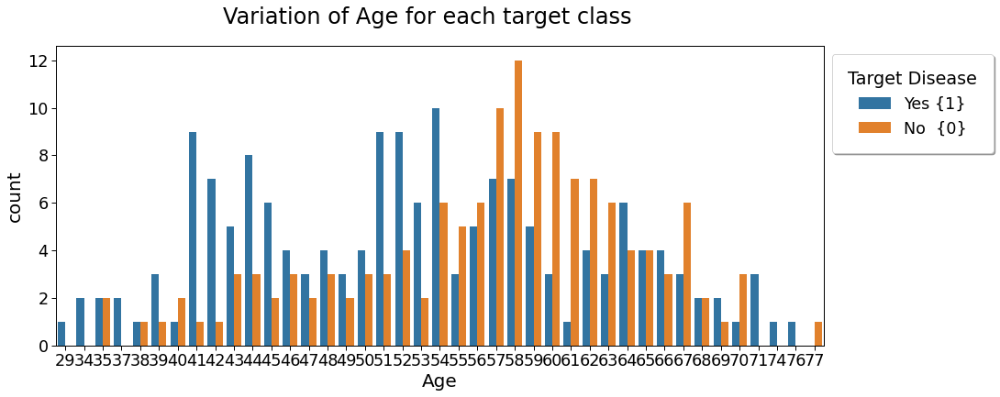

In [30]:
# distribution of age  with target Class
sb.set_context("paper", font_scale = 2, rc = {"font.size": 20,"axes.titlesize": 25,"axes.labelsize": 20}) 
fig, ax = plt.subplots(figsize=(15, 6))
a = sb.countplot(ax = ax, data = df, x = 'Age', hue = 'Target_Disease', order = df['Age'].sort_values().unique())
#sb.displot(data=df, x="Age", kde=True)
legend_labels, _= a.get_legend_handles_labels()
ax.legend(legend_labels, ['Yes {1}','No  {0}'], bbox_to_anchor=(1,1),title="Target Disease",fancybox=True, framealpha=1, shadow=True, borderpad=1)
fig.suptitle('Variation of Age for each target class')
plt.show()

<AxesSubplot:xlabel='Sex', ylabel='Age'>

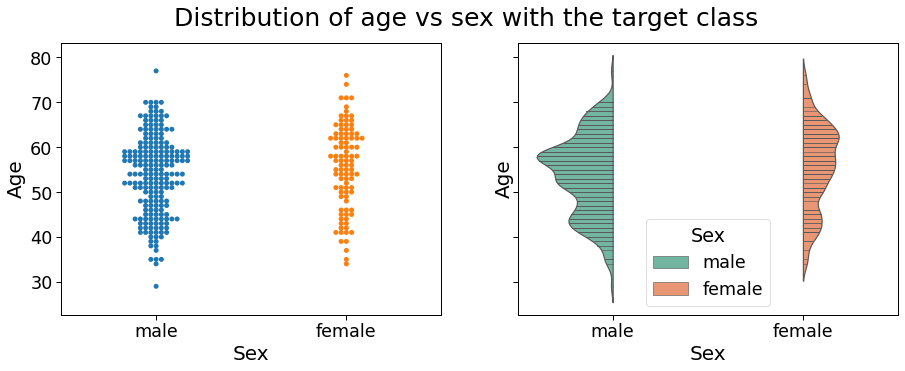

In [6]:
# distribution of sex vs age  with target
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)
fig.suptitle('Distribution of age vs sex with the target class',fontsize=25)

sb.swarmplot(ax=axes[0],y = df['Age'], x = df['Sex'])

sb.violinplot(ax=axes[1],x="Sex", y= df['Age'], hue="Sex",
                    data=df, palette="Set2", split=True,
                    scale="count", inner="stick",
                    scale_hue=False, bw=.2)

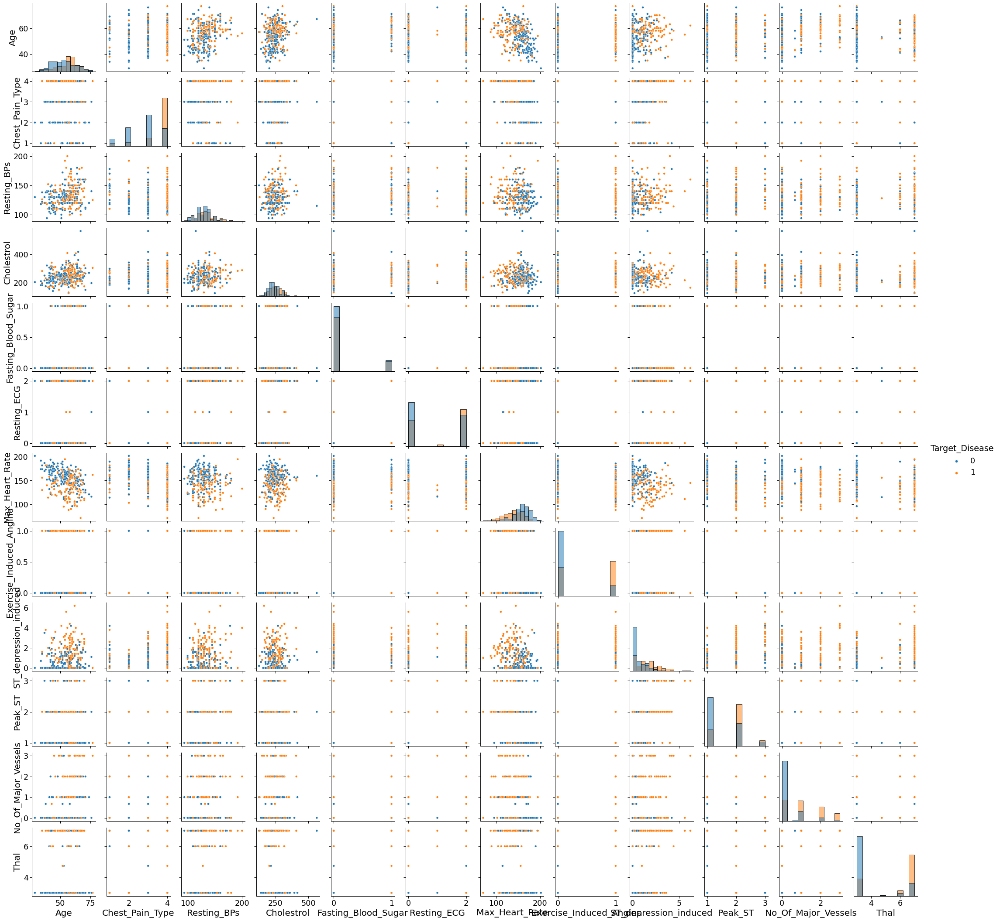

In [7]:
# Here we plot the pairplot of all the feature with respect to the others. 
# Graph --
sb.pairplot(df, hue='Target_Disease',diag_kind = 'hist')

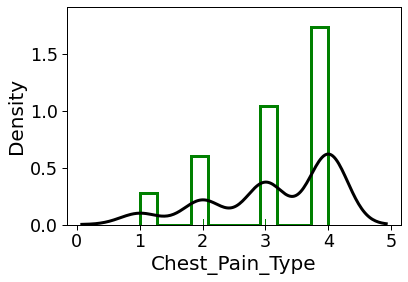

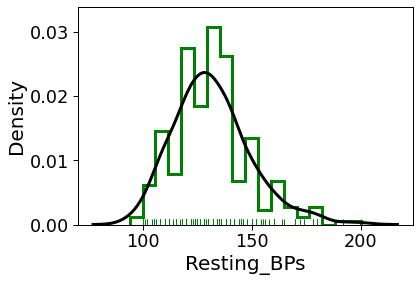

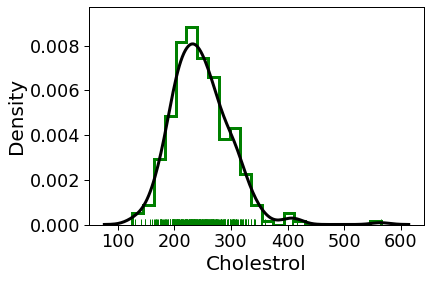

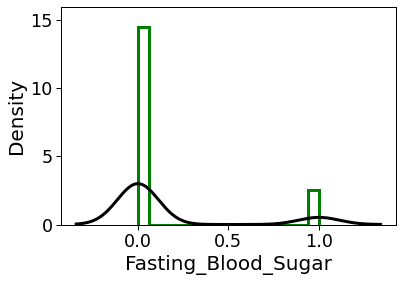

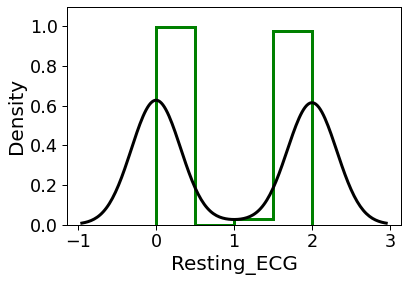

...

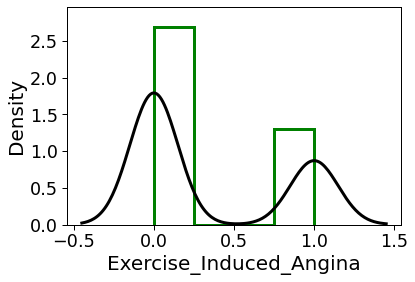

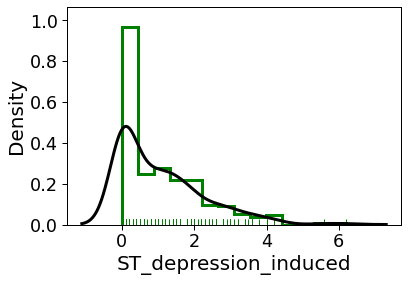

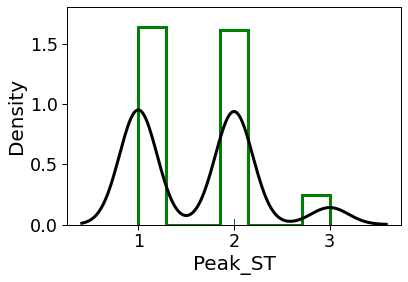

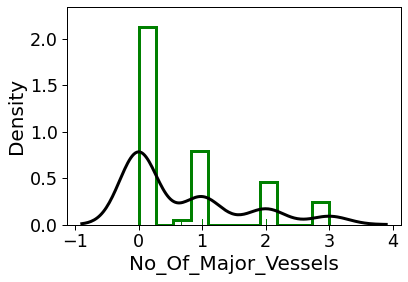

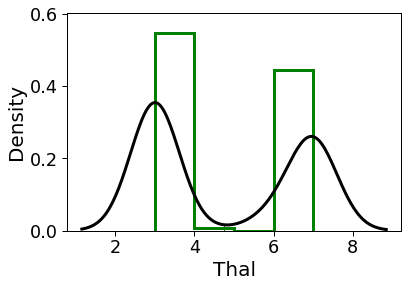

In [8]:
lables = np.array(df.columns[2:-1])

for i in (lables):
    plt.figure()
    sb.distplot(df[i], rug=True, rug_kws={"color": "g"},
              kde_kws={"color": "k", "lw": 3, "label": "KDE"},
              hist_kws={"histtype": "step", "linewidth": 3,
                        "alpha": 1, "color": "g"})

In [34]:
df['Sex'] = df.Sex.map({'female': 0, 'male': 1})

In [10]:
features = df.iloc[:, :-1].values
labels = df.iloc[:, -1].values
# Splits data 80/20
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size = 0.2, random_state = 0)

In [11]:
from sklearn.preprocessing import StandardScaler as ss
sc = ss()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
X_train

array([[-1.13185208,  0.67015058,  0.86665919, ..., -0.98667524,
         0.32127709, -0.97888213],
       [ 0.07286213,  0.67015058,  0.86665919, ...,  0.59461885,
         0.32127709,  1.08790769],
       [-0.03665734,  0.67015058,  0.86665919, ...,  0.59461885,
         0.32127709,  1.08790769],
       ...,
       [-2.11752735, -1.49220195,  0.86665919, ..., -0.98667524,
        -0.71560817, -0.97888213],
       [-0.47473524,  0.67015058,  0.86665919, ...,  0.59461885,
        -0.71560817,  1.08790769],
       [ 0.51094003, -1.49220195,  0.86665919, ...,  0.59461885,
        -0.71560817, -0.97888213]])

In [12]:
# Confusion Matrix visualization Function
def plotConfusionMatrixFunction(ClassifierLabel,classifier,X_train,y_train):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
    fig.suptitle(ClassifierLabel,fontsize=20)
    print()
    disp = plot_confusion_matrix(classifier, X_train, y_train, ax = axes[0], display_labels=["Yes", "No"],cmap=plt.cm.YlGnBu) 
    disp.ax_.set_title('Confusion Matrix for training set',fontsize = 15)

    disp = plot_confusion_matrix(classifier, X_test, y_test, ax = axes[1], display_labels=["Yes", "No"],cmap=plt.cm.YlGnBu) 
    disp.ax_.set_title('Confusion Matrix for testing set',fontsize = 15)

In [13]:
def plotClassifierGraph(classifier, X_train, X_test):
    pca = PCA()
    X_train_scaled = scale(X_train)
    X_test_scaled = scale(X_test)
    X_train_pca = pca.fit_transform(X_train_scaled)

    pc1 = X_train_pca[:, 0]
    pc2 = X_train_pca[:, 1]

    # # pc1 contains the x-axis coordinates of the data after PCA
    # # pc2 contains the y-axis coordinates of the data after PCA

    # # Now we fittthe SVM to the x and y-axis coordinates
    # # of the data after PCA dimension reduction...

    classifier.fit(np.column_stack((pc1, pc2)), y_train)

    # # Now create a matrix of points that we can use to show
    # # the decision regions.
    # # The matrix will be a little bit larger than the
    # # transformed PCA points so that we can plot all of
    # # the PCA points on it without them being on the edge

    x_min = pc1.min() - 1
    x_max = pc1.max() + 1

    y_min = pc2.min() - 1
    y_max = pc2.max() + 1

    (xx, yy) = np.meshgrid(np.arange(start=x_min, stop=x_max,
                           step=0.1), np.arange(start=y_min,
                           stop=y_max, step=0.1))

    # # now we will classify every point in that
    # # matrix with the SVM. Points on one side of the
    # # classification boundary will get 0, and points on the other
    # # side will get 1.

    Z = classifier.predict(np.column_stack((xx.ravel(), yy.ravel())))

    # # Right now, Z is just a long array of lots of 0s and 1s, which
    # # reflect how each point in the mesh was classified.
    # # We use reshape() so that each classification (0 or 1) corresponds
    # # to a specific point in the matrix.

    Z = Z.reshape(xx.shape)

    (fig, ax) = plt.subplots(figsize=(10, 10))

    # # now we will use contourf() to draw a filled contour plot
    # # using the matrix values and classifications.
    # # The contours will be filled according to the
    # # predicted classifications (0s and 1s) in Z

    ax.contourf(xx, yy, Z, cmap=plt.cm.winter, alpha=0.1)
    ax.xaxis.grid(True, zorder=0)
    ax.yaxis.grid(True, zorder=0)

    # # now create custom colors for the actual data points

    cmap = colors.ListedColormap(['#00796B', '#F44336'])

    # # now darw the actual data points - these will
    # # be colored by their known (not predcited) classifications
    # # NOTE: setting alpha=0.7 lets us see if we are covering up a point

    scatter = ax.scatter(  # # 'k' = black
        pc1,
        pc2,
        c=y_train,
        cmap=cmap,
        s=120,
        edgecolors='k',
        alpha=0.5,
        )

    # # now create a legend

    legend = ax.legend(scatter.legend_elements()[0],
                       scatter.legend_elements()[1], loc='upper right')
    legend.get_texts()[0].set_text('No Heart Disease')
    legend.get_texts()[1].set_text('Yes Heart Disease')

    # # now add axis labels and titles

    ax.set_ylabel('Principal Component - 2')
    ax.set_xlabel('Principal Component - 1')
    ax.set_title('Decison surface using the PCA transformed/projected features'
                 )

    # plt.savefig('svm.png')

    plt.show()


In [14]:
#########################################   SVM   #############################################################
from sklearn.svm import SVC
classifier = SVC(kernel = 'rbf')
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
cm_test = confusion_matrix(y_pred, y_test)

y_pred_train = classifier.predict(X_train)
cm_train = confusion_matrix(y_pred_train, y_train)

print('Accuracy for training set for svm = {}'.format((cm_train[0][0] + cm_train[1][1])/len(y_train)))  
print('Accuracy for test set for svm = {}'.format((cm_test[0][0] + cm_test[1][1])/len(y_test)))


Accuracy for training set for svm = 0.9256198347107438
Accuracy for test set for svm = 0.8032786885245902


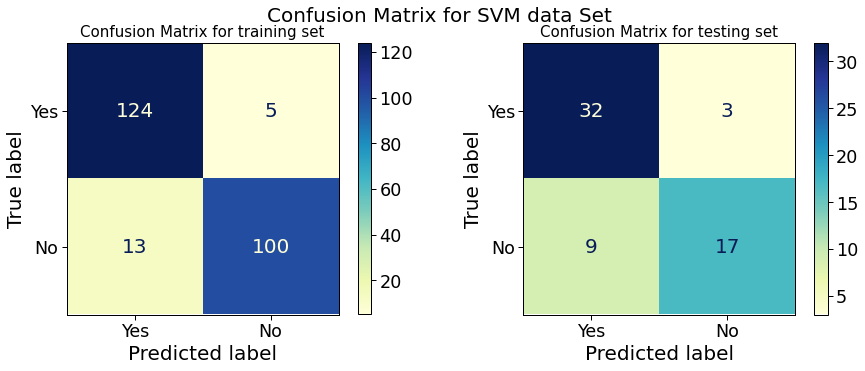

In [15]:
plotConfusionMatrixFunction('Confusion Matrix for SVM data Set',classifier,X_train,y_train)

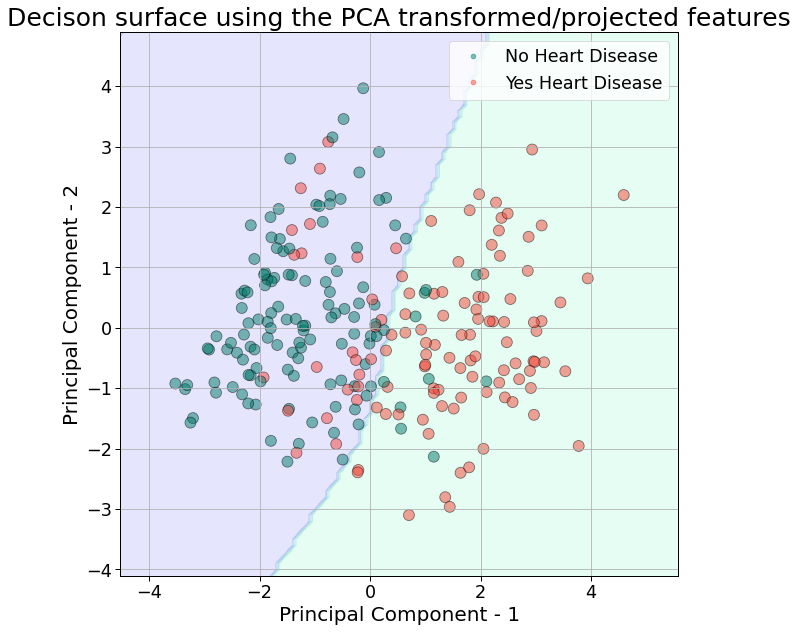

In [16]:
plotClassifierGraph(classifier,X_train,X_test)

In [17]:
#########################################   Naive Bayes  #############################################################
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

from sklearn.metrics import confusion_matrix
cm_test = confusion_matrix(y_pred, y_test)

y_pred_train = classifier.predict(X_train)
cm_train = confusion_matrix(y_pred_train, y_train)

print('Accuracy for training set for Naive Bayes = {}'.format((cm_train[0][0] + cm_train[1][1])/len(y_train)))
print('Accuracy for test set for Naive Bayes = {}'.format((cm_test[0][0] + cm_test[1][1])/len(y_test)))

Accuracy for training set for Naive Bayes = 0.8677685950413223
Accuracy for test set for Naive Bayes = 0.7868852459016393


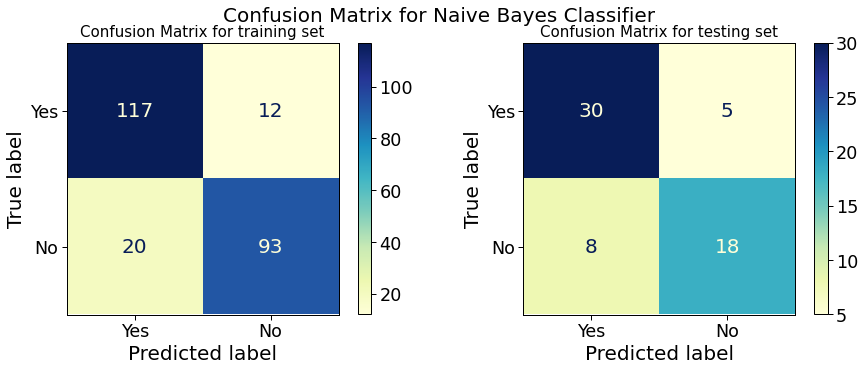

In [18]:
plotConfusionMatrixFunction('Confusion Matrix for Naive Bayes Classifier',classifier,X_train,y_train)

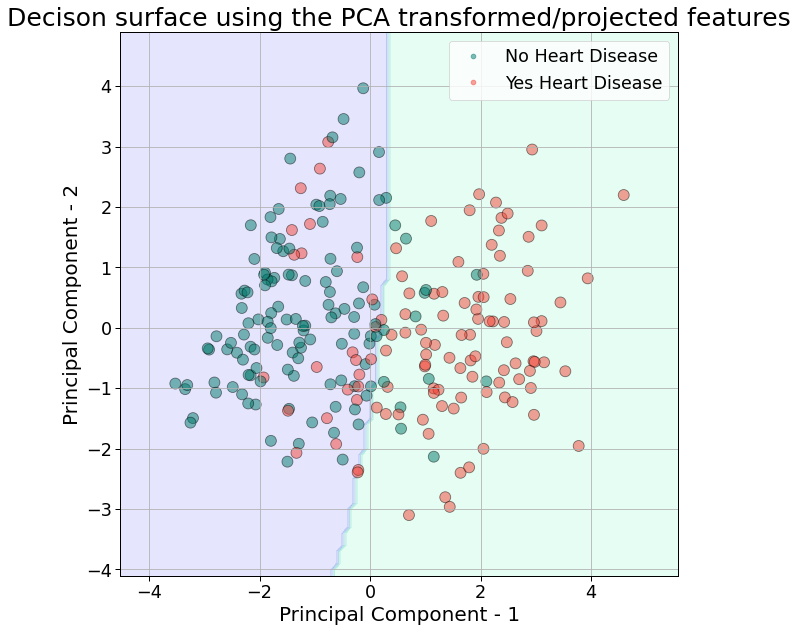

In [19]:
plotClassifierGraph(classifier,X_train,X_test)

In [20]:
#########################################   Logistic Regression  #############################################################
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(max_iter=1000)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

from sklearn.metrics import confusion_matrix
cm_test = confusion_matrix(y_pred, y_test)

y_pred_train = classifier.predict(X_train)
cm_train = confusion_matrix(y_pred_train, y_train)
print()
print('Accuracy for training set for Logistic Regression = {}'.format((cm_train[0][0] + cm_train[1][1])/len(y_train)))
print('Accuracy for test set for Logistic Regression = {}'.format((cm_test[0][0] + cm_test[1][1])/len(y_test)))



Accuracy for training set for Logistic Regression = 0.859504132231405
Accuracy for test set for Logistic Regression = 0.7868852459016393


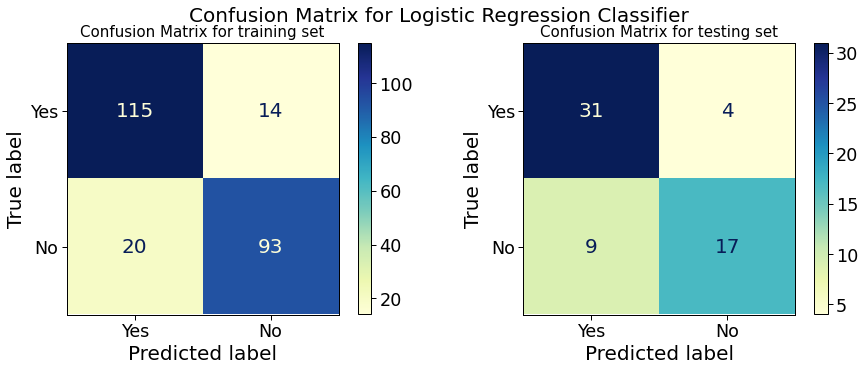

In [21]:
plotConfusionMatrixFunction('Confusion Matrix for Logistic Regression Classifier',classifier,X_train,y_train)

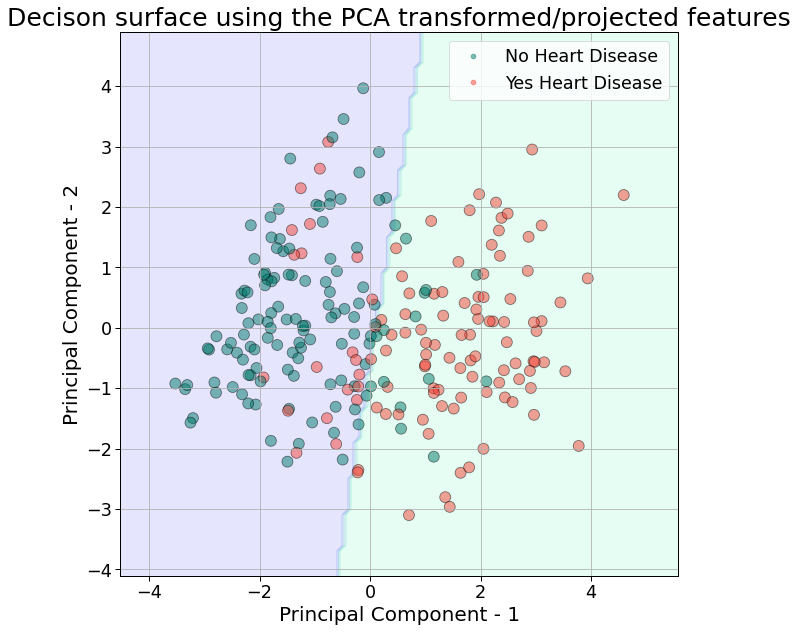

In [22]:
plotClassifierGraph(classifier,X_train,X_test)

In [35]:
#########################################   Decision Tree  #############################################################
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier()
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

from sklearn.metrics import confusion_matrix
cm_test = confusion_matrix(y_pred, y_test)

y_pred_train = classifier.predict(X_train)
cm_train = confusion_matrix(y_pred_train, y_train)

print()

print('Accuracy for training set for Decision Tree = {}'.format((cm_train[0][0] + cm_train[1][1])/len(y_train)))
print('Accuracy for test set for Decision Tree = {}'.format((cm_test[0][0] + cm_test[1][1])/len(y_test)))



Accuracy for training set for Decision Tree = 1.0
Accuracy for test set for Decision Tree = 0.7704918032786885


Text(0.5, 1.0, '#   Decision Tree  #')

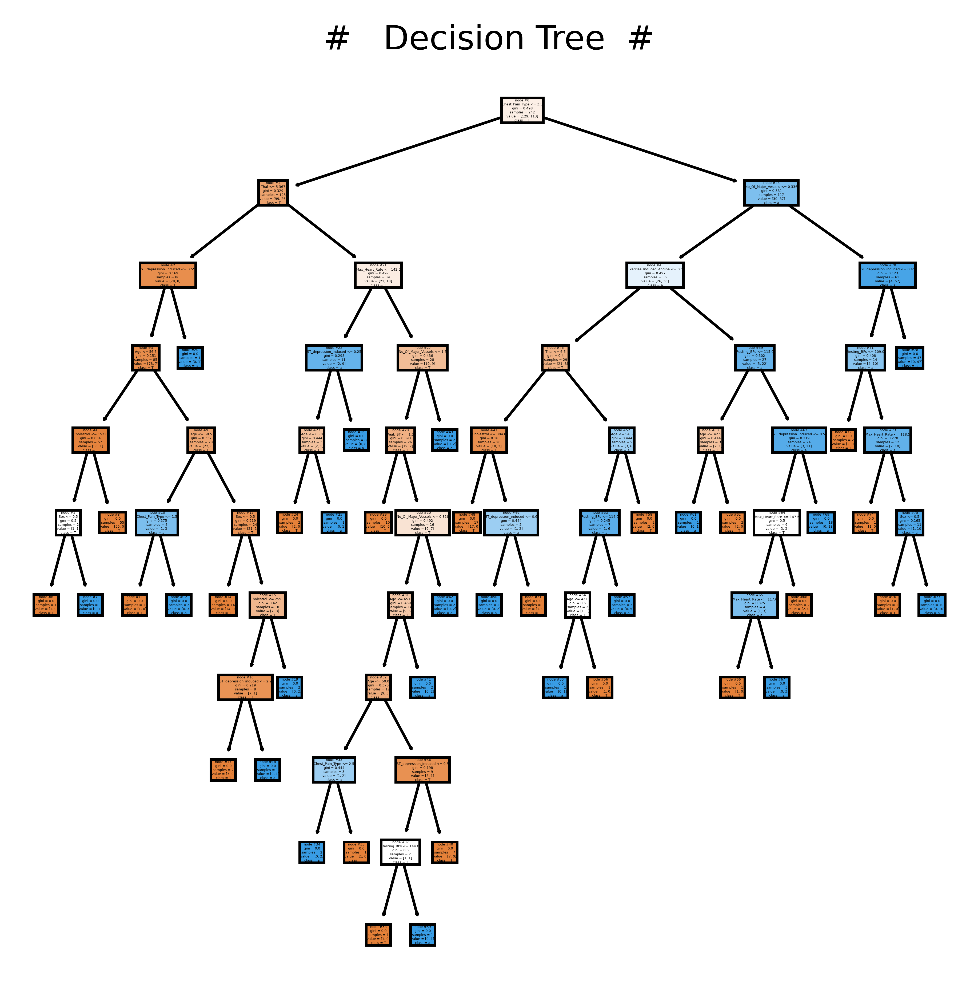

In [36]:
# Plot Decision tree which are shown below,
from sklearn import tree
print()
fig, axes = plt.subplots(figsize = (5,5), dpi= 900)
fn=np.array(df.columns[:-1])
tn=df.columns[-1]
tree.plot_tree(classifier,
               feature_names = fn, 
               class_names=tn,
               node_ids = True,
               filled = True,
               ax = axes);
axes.set_title('#   Decision Tree  #', fontsize=10)
#fig.savefig('DecisionTree.png')

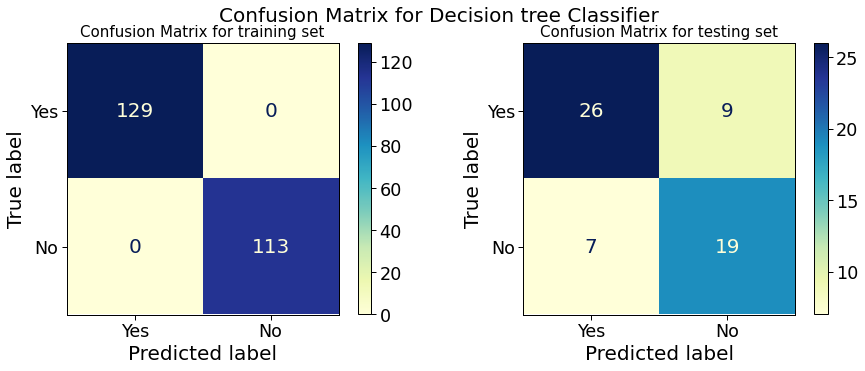

In [107]:
plotConfusionMatrixFunction('Confusion Matrix for Decision tree Classifier',classifier,X_train,y_train)

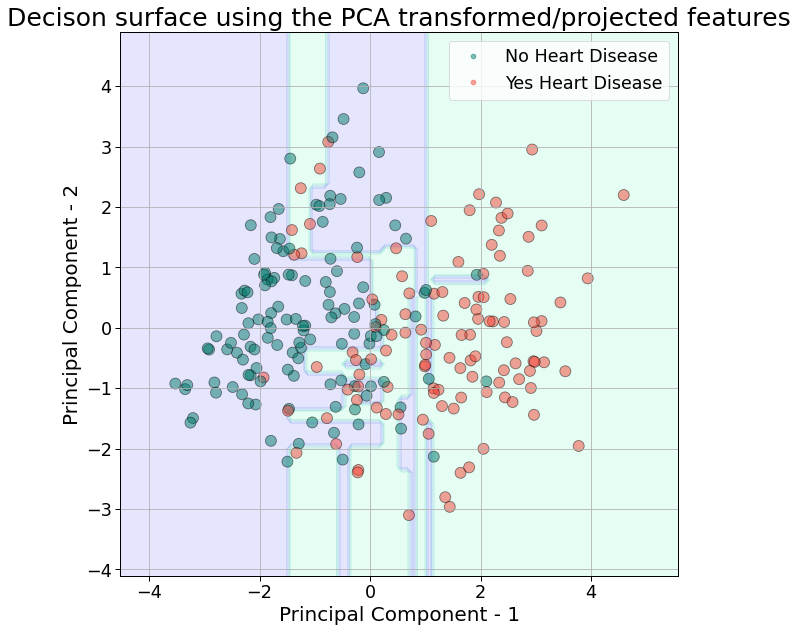

In [108]:
plotClassifierGraph(classifier,X_train,X_test)

In [110]:
#########################################  Random Forest  #############################################################
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 10)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

from sklearn.metrics import confusion_matrix
cm_test = confusion_matrix(y_pred, y_test)

y_pred_train = classifier.predict(X_train)
cm_train = confusion_matrix(y_pred_train, y_train)

print('Accuracy for training set for Random Forest = {}'.format((cm_train[0][0] + cm_train[1][1])/len(y_train)))
print('Accuracy for test set for Random Forest = {}'.format((cm_test[0][0] + cm_test[1][1])/len(y_test)))


Accuracy for training set for Random Forest = 1.0
Accuracy for test set for Random Forest = 0.7213114754098361


In [111]:
# All the Estimator trees are shown below,
from sklearn import tree
print()
fn=np.array(df.columns[:-1])
cn=df.columns[-1]
rows = 0 
cols = 0
fig, axes = plt.subplots(nrows = 5,ncols = 2,figsize = (10,25), dpi=900)
for index in range(0, 10):
    tree.plot_tree(classifier.estimators_[index],
                   feature_names = fn, 
                   class_names=cn,
                   node_ids = True,
                   filled = True,
                   ax = axes[rows][cols]);
    axes[rows][cols].set_title('Estimator: ' + str(index+1), fontsize = 11)
    cols += 1
    if(cols>=2):
        cols = 0
        rows += 1
#fig.savefig('RandomForests.png')

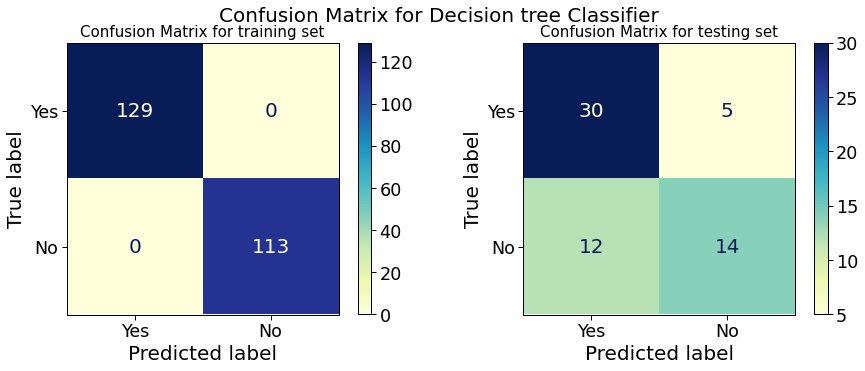

In [112]:
plotConfusionMatrixFunction('Confusion Matrix for Decision tree Classifier',classifier,X_train,y_train)

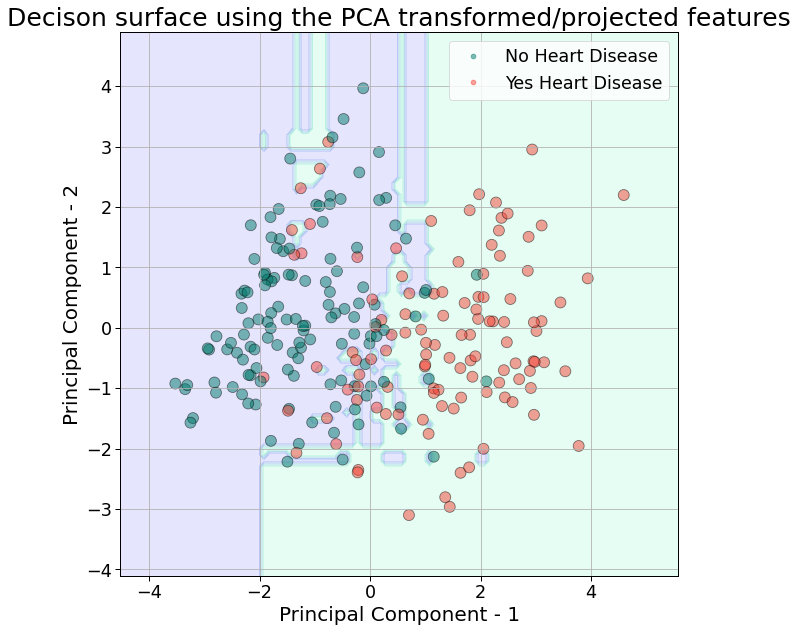

In [113]:
plotClassifierGraph(classifier,X_train,X_test)